# C. elegans Connectome Development: A Comprehensive Analysis

This notebook demonstrates a complete analysis and visualization pipeline for the *C. elegans* connectome development dataset from Witvliet et al. (2021). It showcases data loading, network analysis, and the generation of both static and advanced interactive visualizations.

## Analysis Pipeline Overview

1.  **Setup & Data Loading**: Configure the environment and process the raw connectome data into a temporal graph format.
2.  **Core Network Analysis**: Perform network growth, connection stability, and node importance analysis.
3.  **Static Visualizations**: Generate a suite of static plots summarizing key developmental trends, including an MP4 animation of network growth.
4.  **Interactive Visualizations**: Create dynamic, explorable HTML plots, including a full network development animation, an analysis dashboard, and a node importance heatmap.

## Dataset Information

- **Source**: Witvliet et al. 2021 - "Connectomes across development reveal principles of brain maturation"
- **Organism**: *Caenorhabditis elegans*
- **Timepoints**: 8 developmental stages from L1 larva to adult.
- **Data Type**: Synaptic connections (chemical and electrical)

In [2]:
import sys
import os
import warnings
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import webbrowser

# Add parent directory to path to import custom modules
sys.path.append(str(Path.cwd().parent))

# Import custom modules from the provided scripts
from devotg.data import load_connectome_datasets
from devotg.analysis import analyze_connectome_network
from devotg.visualization import ConnectomeVisualizer, InteractiveConnectomeVisualizer
from devotg.visualization import NeuralNetworkAnimator

warnings.filterwarnings('ignore')

print("✅ All modules imported successfully!")

✅ All modules imported successfully!


## 1. Data Loading and Processing

First, we download the Witvliet connectome datasets. The `load_connectome_datasets` function handles downloading, processing the raw Excel files, and saving them into a standardized CSV format (nodes, temporal edges, and summary statistics).

In [3]:
# Define paths for data and outputs
PROCESSED_DATA_DIR = "../data/processed_datasets"
RAW_DATA_DIR = "../data/connectome_datasets"
OUTPUT_DIR = "../outputs/connectome_analysis/visualizations"
ANALYSIS_DIR = "../outputs/connectome_analysis/statistics"

# Create output directories if they don't exist
os.makedirs(PROCESSED_DATA_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(ANALYSIS_DIR, exist_ok=True)

# Check if data is already processed
processed_file_check = os.path.join(PROCESSED_DATA_DIR, "dtdg_edges_temporal.csv")

if os.path.exists(processed_file_check):
    print("✅ Dataset already processed. Skipping download.")
else:
    print("Downloading and processing connectome datasets...")
    try:
        load_connectome_datasets(
            data_dir=RAW_DATA_DIR,
            output_dir=PROCESSED_DATA_DIR
        )
        print("✅ Dataset processing complete!")
    except Exception as e:
        print(f"❌ Error during data processing: {e}")

✅ Dataset already processed. Skipping download.


In [4]:
# Load the processed datasets into pandas DataFrames
nodes_path = os.path.join(PROCESSED_DATA_DIR, "dtdg_nodes.csv")
edges_path = os.path.join(PROCESSED_DATA_DIR, "dtdg_edges_temporal.csv")
summary_path = os.path.join(PROCESSED_DATA_DIR, "dtdg_summary_statistics.csv")

nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)
summary_df = pd.read_csv(summary_path)

print("Dataset Overview:")
print(f"- Nodes: {len(nodes_df)}")
print(f"- Temporal edges: {len(edges_df)}")
print(f"- Timepoints: {len(summary_df)}")
print(f"- Developmental span: {summary_df['time_hours'].min()}-{summary_df['time_hours'].max()} hours")
print(f"- Stages: {', '.join(summary_df['stage'].unique())}")

Dataset Overview:
- Nodes: 225
- Temporal edges: 12954
- Timepoints: 8
- Developmental span: 0-45 hours
- Stages: L1, L2, L3, Adult


### Dataset Structure Exploration

Neuron Type Distribution:
  Sensory: 64 (28.4%)
  Inter: 43 (19.1%)
  Motor: 42 (18.7%)
  Muscle: 32 (14.2%)
  Modulatory: 31 (13.8%)
  Glia: 10 (4.4%)
  Unknown: 3 (1.3%)


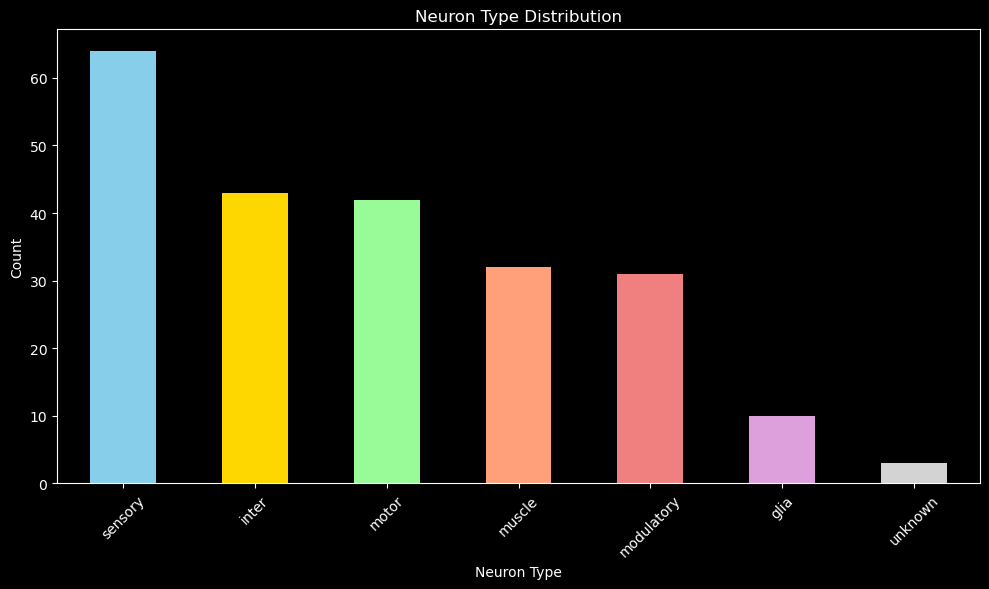

In [5]:
# Explore node types
print("Neuron Type Distribution:")
node_counts = nodes_df['node_type'].value_counts()
for node_type, count in node_counts.items():
    percentage = (count / len(nodes_df)) * 100
    print(f"  {node_type.capitalize()}: {count} ({percentage:.1f}%)")

# Plot node type distribution
plt.figure(figsize=(10, 6))
node_counts.plot(kind='bar', color=['#87CEEB', '#FFD700', '#98FB98', '#FFA07A', '#F08080', '#DDA0DD', '#D3D3D3'])
plt.title('Neuron Type Distribution')
plt.xlabel('Neuron Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [6]:
# Explore temporal development
print("\nTemporal Development Summary:")
summary_display = summary_df[['timepoint', 'stage', 'time_hours', 'description', 'num_edges', 'total_synapses']].copy()
summary_display.columns = ['TP', 'Stage', 'Hours', 'Description', 'Edges', 'Synapses']
print(summary_display.to_string(index=False))


Temporal Development Summary:
 TP Stage  Hours Description  Edges  Synapses
  1    L1      0       Birth    858      1400
  2    L1      5     L1 5hrs   1110      2028
  3    L1      8     L1 8hrs   1106      2237
  4    L1     16    L1 16hrs   1345      3020
  5    L2     23    L2 23hrs   1807      4535
  6    L3     27    L3 27hrs   1739      4723
  7 Adult     45 Adult 45hrs   2493      7867
  8 Adult     45 Adult 45hrs   2496      8400


## 2. Core Network Analysis

Next, we perform a comprehensive analysis of the temporal network. The `analyze_connectome_network` function calculates:
- **Network Growth**: Metrics like edge count, density, and average degree over time.
- **Connection Stability**: Classifies connections as stable, developmental, or variable.
- **Node Importance**: Tracks centrality measures (degree, betweenness, etc.) for each node across all timepoints.

In [7]:
print("Performing comprehensive network analysis...")

analyze_connectome_network(
    edges_csv_path=edges_path,
    nodes_csv_path=nodes_path,
    output_dir=ANALYSIS_DIR
)

print(f"✅ Network analysis complete! Results saved to '{ANALYSIS_DIR}'.")

Performing comprehensive network analysis...
✅ Network analysis complete! Results saved to '../outputs/connectome_analysis/statistics'.


In [9]:
# Load and display growth analysis results
growth_df = pd.read_csv("../outputs/connectome_analysis/statistics/network_growth_analysis.csv")

print("Network Growth Metrics:")
display_cols = ['timepoint', 'stage', 'num_edges', 'num_chemical', 'num_electrical', 'connection_density']
print(growth_df[display_cols].round(4).to_string(index=False))

Network Growth Metrics:
 timepoint stage  num_edges  num_chemical  num_electrical  connection_density
         1    L1        858           775              83              0.0170
         2    L1       1110           986             124              0.0220
         3    L1       1106          1012              94              0.0219
         4    L1       1345          1136             209              0.0267
         5    L2       1807          1515             292              0.0359
         6    L3       1739          1525             214              0.0345
         7 Adult       2493          2202             291              0.0495
         8 Adult       2496          2186             310              0.0495


## 3. Static Visualizations

This section generates a series of informative static plots using `matplotlib` and `seaborn`. These visualizations provide a high-level overview of the connectome's development. An MP4 animation showing the network's growth is also saved.

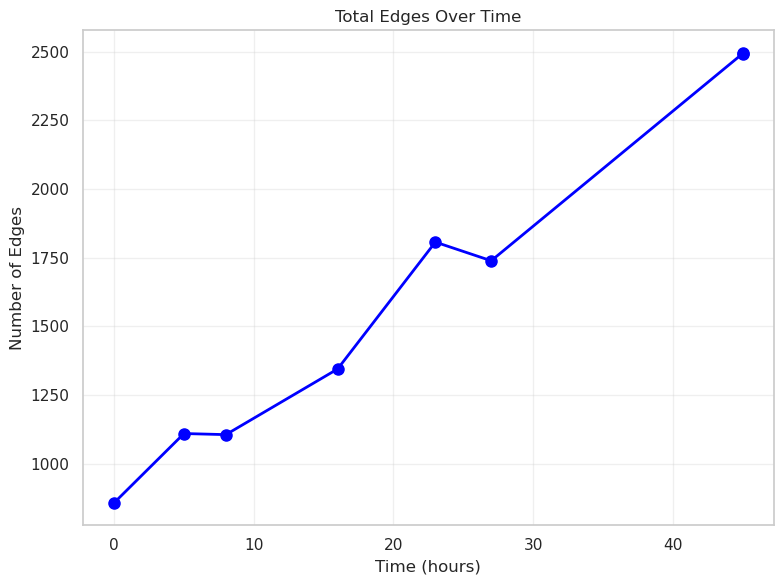

In [ ]:
# Visualize network growth metrics
plt.figure(figsize=(8, 6))

# Total edges over time
plt.plot(growth_df['time_hours'], growth_df['num_edges'], 'o-', color='blue', linewidth=2, markersize=8)
plt.title('Total Edges Over Time')
plt.xlabel('Time (hours)')
plt.ylabel('Number of Edges')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Generating static visualizations...
  - Creating growth metrics plot...


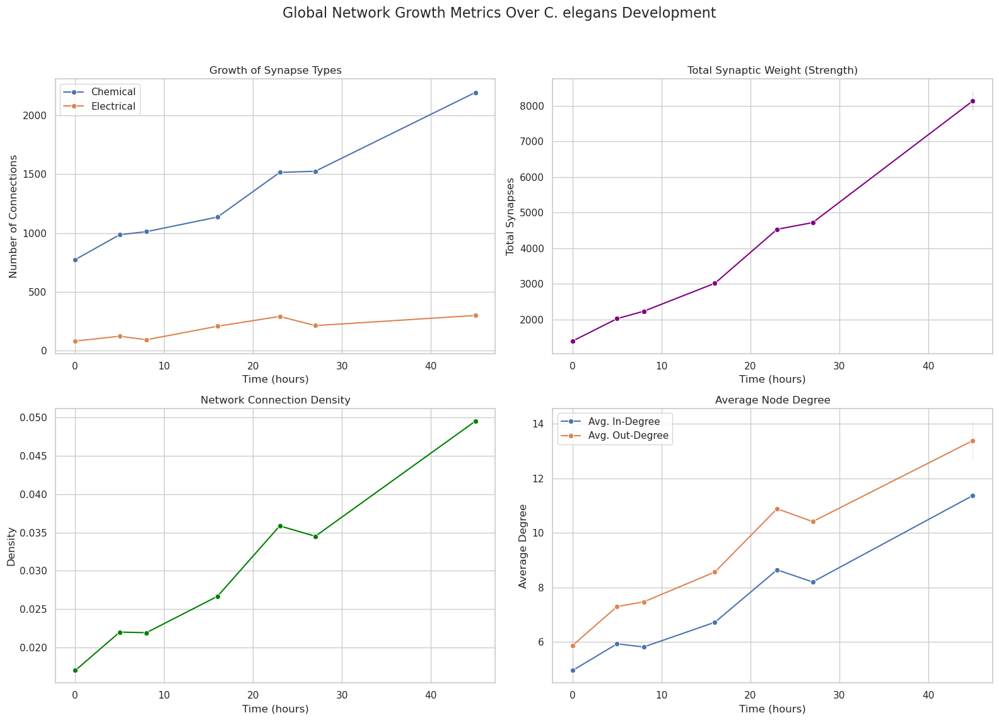

In [12]:
# Initialize the static visualizer
static_viz = ConnectomeVisualizer(edges_df, nodes_df, summary_df)

print("Generating static visualizations...")

# 1. Comprehensive growth metrics plot
print("  - Creating growth metrics plot...")
static_viz.create_growth_metrics_plot(save_path=os.path.join(OUTPUT_DIR, 'network_growth_metrics.png'))
plt.show()

  - Creating connection types plot...


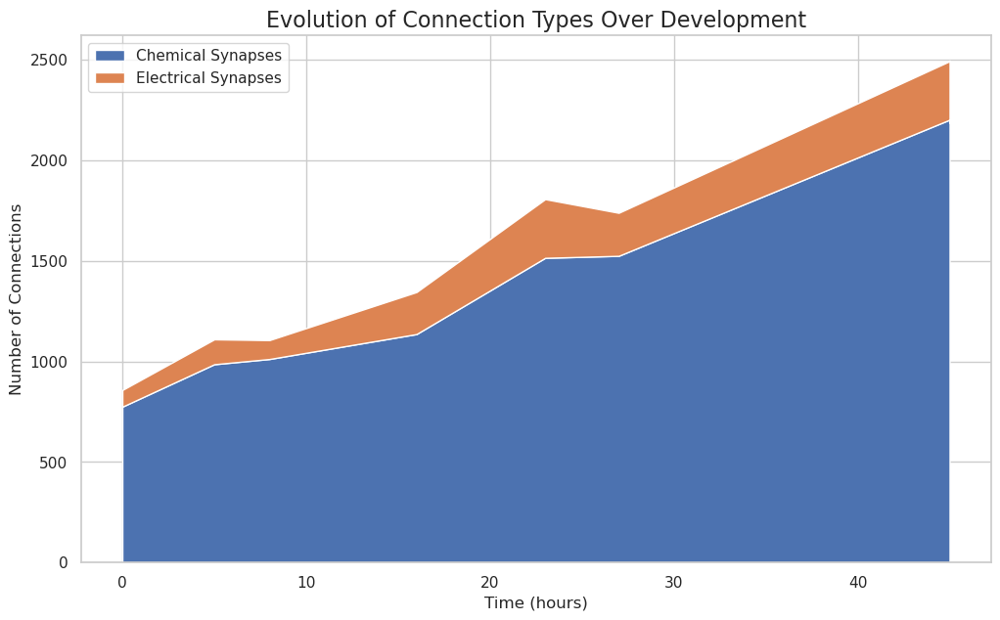

In [13]:
# 2. Connection types evolution plot
print("  - Creating connection types plot...")
static_viz.create_connection_types_plot(save_path=os.path.join(OUTPUT_DIR, 'connection_types_evolution.png'))
plt.show()

  - Creating centrality analysis plot...


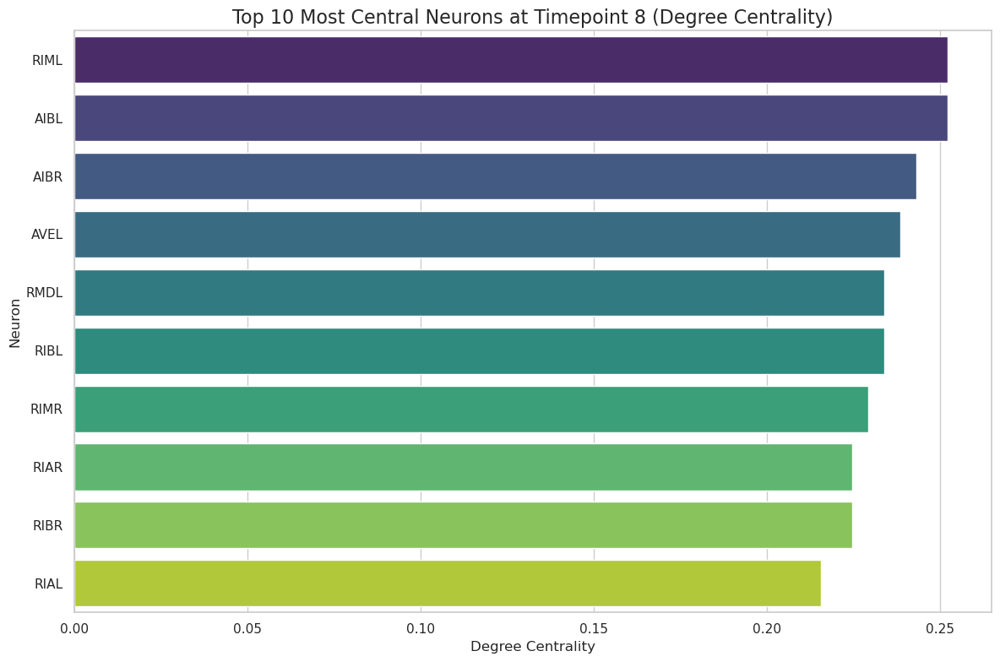

In [14]:
# 3. Centrality analysis plot for the final timepoint
print("  - Creating centrality analysis plot...")
static_viz.create_centrality_analysis_plot(save_path=os.path.join(OUTPUT_DIR, 'centrality_analysis.png'))
plt.show()

  - Creating network graph plot...


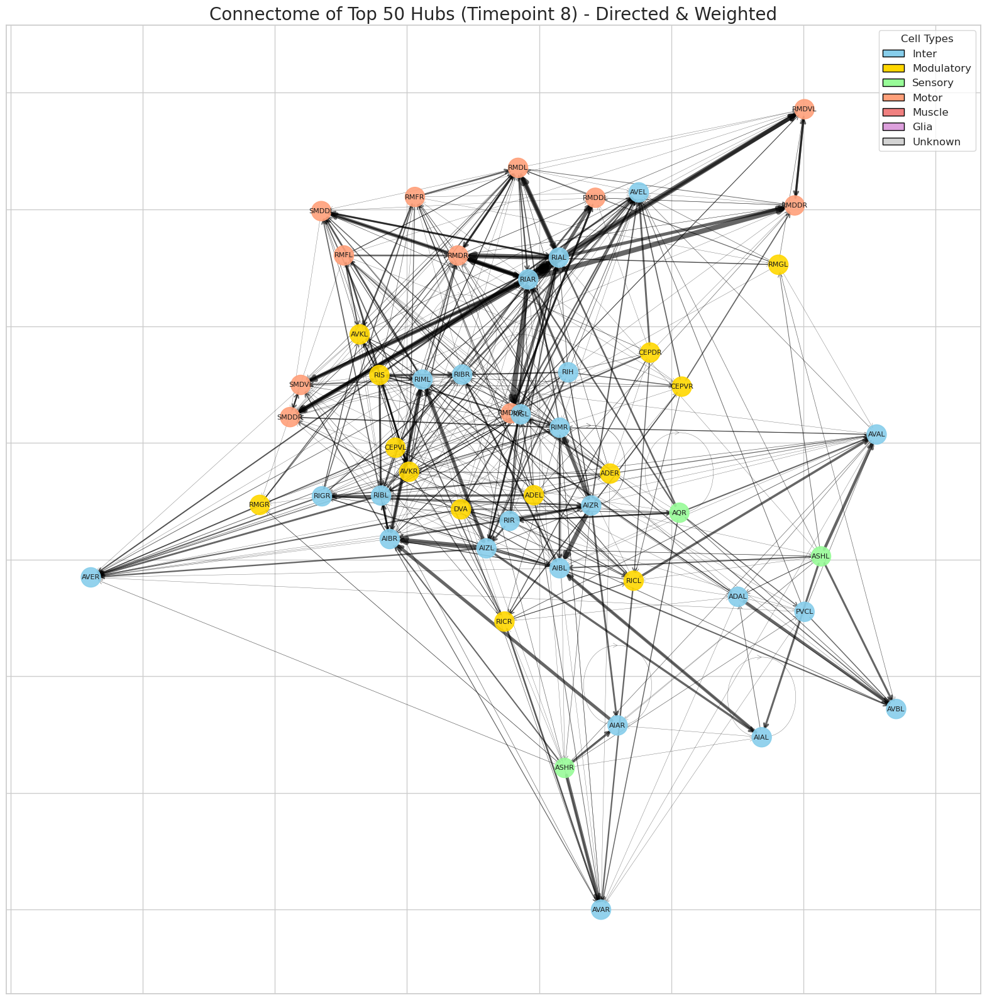

In [15]:
# 4. Network graph of top hubs at the final timepoint
print("  - Creating network graph plot...")
static_viz.create_network_graph_plot(save_path=os.path.join(OUTPUT_DIR, 'network_graph_hubs.png'))
plt.show()

In [16]:
# 5. Generate and save the network growth animation (MP4)
print("  - Generating MP4 animation (this may take a moment)...")
animation_path = os.path.join(OUTPUT_DIR, 'network_development_animation.mp4')
static_viz.create_animated_network_growth(output_path=animation_path)

print(f"\n✅ All static visualizations saved to '{OUTPUT_DIR}'.")

  - Generating MP4 animation (this may take a moment)...

✅ All static visualizations saved to '../outputs/connectome_analysis/visualizations'.


## 4. Interactive Visualizations

Here, we leverage `plotly` to create rich, interactive HTML visualizations. These plots allow for deeper, user-driven exploration of the data. Each visualization is saved as an HTML file and can be opened directly in your web browser.

In [22]:
def save_and_open_html(fig, file_path, open_in_browser=True):
    """Helper function to save a Plotly figure and optionally open it."""
    fig.write_html(file_path)
    print(f"✅ Saved interactive plot to: {file_path}")
    if open_in_browser:
        webbrowser.open('file://' + os.path.realpath(file_path))
        print("  -> Opening in browser...")

# Set this to False if you don't want files to open automatically
OPEN_PLOTS_IN_BROWSER = False

# Initialize interactive visualizers
interactive_viz = InteractiveConnectomeVisualizer(edges_df, nodes_df, summary_df)
animator = NeuralNetworkAnimator(nodes_df, edges_df, summary_df)

In [23]:
# 1. Interactive Network Analysis Dashboard
print("\n--- Generating Interactive Network Analysis Dashboard ---")
dashboard = interactive_viz.create_network_analysis_dashboard()
dashboard_path = os.path.join(OUTPUT_DIR, 'network_analysis_dashboard.html')
save_and_open_html(dashboard, dashboard_path, OPEN_PLOTS_IN_BROWSER)
dashboard.show() # Display inline


--- Generating Interactive Network Analysis Dashboard ---
✅ Saved interactive plot to: ../outputs/connectome_analysis/visualizations/network_analysis_dashboard.html


In [24]:
# 2. Node Importance Heatmap
print("\n--- Generating Node Importance Heatmap ---")
heatmap = interactive_viz.create_node_importance_heatmap()
heatmap_path = os.path.join(OUTPUT_DIR, 'node_importance_heatmap.html')
save_and_open_html(heatmap, heatmap_path, OPEN_PLOTS_IN_BROWSER)
heatmap.show() # Display inline


--- Generating Node Importance Heatmap ---
✅ Saved interactive plot to: ../outputs/connectome_analysis/visualizations/node_importance_heatmap.html


In [ ]:
# 3. Interactive Network Explorer
print("\n--- Generating Interactive Network Explorer ---")
explorer = interactive_viz.create_interactive_network_explorer()
explorer_path = os.path.join(OUTPUT_DIR, 'interactive_network_explorer.html')
save_and_open_html(explorer, explorer_path, OPEN_PLOTS_IN_BROWSER)
# explorer.show() # uncomment to display inline


--- Generating Interactive Network Explorer ---
✅ Saved interactive plot to: ../outputs/connectome_analysis/visualizations/interactive_network_explorer.html


In [26]:
# 4. Full Interactive Network Development Animation
print("\n--- Generating Full Interactive Animation (this is computationally intensive) ---")
interactive_animation = animator.create_full_animation()
animation_html_path = os.path.join(OUTPUT_DIR, 'neural_development_animation.html')
save_and_open_html(interactive_animation, animation_html_path, OPEN_PLOTS_IN_BROWSER)
# interactive_animation.show() # uncomment to display inline


--- Generating Full Interactive Animation (this is computationally intensive) ---
✅ Saved interactive plot to: ../outputs/connectome_analysis/visualizations/neural_development_animation.html


## 5. Conclusion

This notebook has successfully executed the complete pipeline for analyzing the *C. elegans* developmental connectome. We have:

1.  **Loaded and processed** the raw data into a usable format.
2.  **Analyzed** the network's growth, stability, and key nodes over time.
3.  **Generated** a comprehensive set of static and interactive visualizations.

All analysis results and visualizations have been saved to the `../outputs/` directory for further exploration.